# Continuous Denoising Diffusion and Score-Based Models

This notebook is the bridge between VAEs and modern diffusion models.

Yesterday you implemented a VAE and a simple hierarchical VAE. Today you will see a different way to do likelihood-based generative modeling, based on:

- a **forward diffusion process** that gradually adds Gaussian noise to data,
- a **score function** $\nabla_x \log p_t(x)$ that tells you how to move noisy samples back toward regions of high probability,
- a **reverse-time SDE** (or discrete steps, like DDPM) that turns pure noise into realistic samples.

You will:

- Build intuition for **SDEs** and **forward diffusion processes**.
- Understand the **score** $\nabla_x \log p_t(x)$ as a geometric object.
- See how the **reverse SDE** uses the score to transform noise into data.
- Learn how **denoising score matching** trains a neural network to approximate the score.
- Compare a continuous SDE forward process to a **DDPM-style** discrete forward process.

---


## 0. Where we are in the course

You have already seen:

- **VAE**: introduce a latent variable $z$, model
  $$
  p_\theta(x, z) = p(z)\, p_\theta(x \mid z)
  $$
  and maximize the ELBO. Sampling means:
  1. draw $z \sim p(z)$,
  2. decode $x \sim p_\theta(x \mid z)$.

- **Hierarchical VAE**: introduce several latent layers
  $z^{(L)}, \dots, z^{(1)}$, with conditional priors like
  $$
  p_\theta(z^{(1)} \mid z^{(2)}), \quad
  p_\theta(z^{(2)} \mid z^{(3)}), \dots
  $$
  plus one likelihood $p_\theta(x \mid z^{(1)})$.

Diffusion and score-based models take a different route:

- Instead of introducing latent variables explicitly, they introduce **time**.
- They define a **noising process** $x_0 \to x_t$ that gradually destroys structure.
- They learn a **denoising (or reverse) process** that reconstructs structure over time.

Roughly:

- VAEs: learn a map between $x$ and latent $z$.
- Diffusion: learn how $x$ moves in time under noise and how to reverse that motion.

---


## 1. Setup

You do not need to understand every line of this section. It is mainly infrastructure.
We will focus on the mathematical parts in later sections.


In [2]:
import math
import random

import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset

import matplotlib.pyplot as plt
import numpy as np

# Make plots a bit nicer
plt.rcParams["figure.dpi"] = 120
plt.rcParams["figure.figsize"] = (4, 3)

# Reproducibility
def set_seed(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


def show_1d_hist(samples: np.ndarray, bins: int = 100, title: str = "", density: bool = True):
    """
    Helper to plot a 1D histogram of samples.
    """
    plt.figure()
    plt.hist(samples, bins=bins, density=density, alpha=0.7)
    plt.xlabel("x")
    plt.ylabel("density" if density else "count")
    if title:
        plt.title(title)
    plt.grid(alpha=0.2)
    plt.show()


def show_2d_scatter(x: np.ndarray, y: np.ndarray, title: str = "", s: float = 5.0):
    """
    Helper to plot a 2D scatter.
    """
    plt.figure()
    plt.scatter(x, y, s=s, alpha=0.7)
    if title:
        plt.title(title)
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.grid(alpha=0.2)
    plt.gca().set_aspect("equal", "box")
    plt.show()


Using device: cpu


## 2. Diffusion as a stochastic differential equation

Before we talk about diffusion models, we need a clear picture of **diffusion as a stochastic process**.

A (time dependent) stochastic differential equation (SDE) in $\mathbb{R}^d$ has the form

$$
d\mathbf{x}_t = \mathbf{f}(\mathbf{x}_t, t)\, dt + g(t)\, d\mathbf{w}_t,
$$

where:

- $\mathbf{x}_t \in \mathbb{R}^d$ is the state at time $t$,
- $\mathbf{f}(\mathbf{x}_t, t)$ is the **drift** (deterministic velocity),
- $g(t) \ge 0$ is the **diffusion coefficient** (noise strength),
- $\mathbf{w}_t$ is a standard Brownian motion (Wiener process).

Intuition:

- The drift moves the state in a predictable way.
- The Brownian motion plus diffusion coefficient adds random fluctuations.

A very simple case is **pure diffusion** with zero drift:

$$
d\mathbf{x}_t = g\, d\mathbf{w}_t,
$$

where $g$ is a constant. In one dimension this describes a particle whose position is
randomly kicked at each instant, with no preferred direction.

We now simulate a simple SDE in 1D to get some intuition.


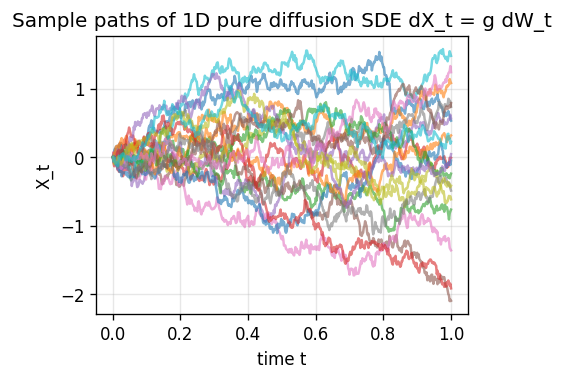

In [3]:
def simulate_1d_pure_diffusion(
    x0: float = 0.0,
    g: float = 1.0,
    T: float = 1.0,
    num_steps: int = 1000,
    num_paths: int = 10,
):
    """
    Simulate the 1D SDE:

        dX_t = g dW_t

    using Euler Maruyama.

    Args:
        x0: initial position at t = 0
        g: diffusion coefficient (noise strength)
        T: final time
        num_steps: number of Euler steps
        num_paths: how many sample paths to simulate

    Returns:
        times: numpy array of shape [num_steps + 1]
        paths: numpy array of shape [num_paths, num_steps + 1]
    """
    dt = T / num_steps

    times = np.linspace(0.0, T, num_steps + 1)
    paths = np.zeros((num_paths, num_steps + 1), dtype=np.float32)
    paths[:, 0] = x0

    for i in range(num_steps):
        # dW_t is approximated by sqrt(dt) * N(0, 1)
        dW = np.sqrt(dt) * np.random.randn(num_paths).astype(np.float32)
        paths[:, i + 1] = paths[:, i] + g * dW

    return times, paths


# Run a small simulation and visualize a few sample paths
times, paths = simulate_1d_pure_diffusion(
    x0=0.0,
    g=1.0,
    T=1.0,
    num_steps=500,
    num_paths=20,
)

plt.figure()
for i in range(paths.shape[0]):
    plt.plot(times, paths[i], alpha=0.6)
plt.xlabel("time t")
plt.ylabel("X_t")
plt.title("Sample paths of 1D pure diffusion SDE dX_t = g dW_t")
plt.grid(alpha=0.3)
plt.show()


### Question: what does this SDE do?

Look at the sample paths of the 1D pure diffusion SDE.

1. As time increases, what happens to the **variance** of $X_t$?
2. If we start all paths at $X_0 = 0$, what is the **mean** of $X_t$ for any fixed time $t$?
3. How would you describe the distribution of $X_t$ in words?

We will soon use a very similar SDE, but in **high dimension**, to define the forward diffusion process on data.


**Answers**

1. For the SDE
   $$
   dX_t = g\, dW_t,
   $$
   we can think in discrete time with a small step $\Delta t$:
   $$
   X_{t+\Delta t} \approx X_t + g \sqrt{\Delta t}\, Z,
   $$
   where $Z \sim \mathcal{N}(0, 1)$.

   After $n$ steps, with $t = n \Delta t$,
   $$
   X_t \approx X_0 + g \sum_{k=1}^n \sqrt{\Delta t}\, Z_k,
   $$
   where $(Z_k)$ are independent standard Gaussians.

   - Each increment has variance $\operatorname{Var}[g \sqrt{\Delta t}\, Z_k] = g^2 \Delta t$.
   - Variances of independent increments add:
     $$
     \operatorname{Var}[X_t] = g^2 \Delta t \cdot n = g^2 (n \Delta t) = g^2 t.
     $$

   So the variance grows **linearly in time**: doubling $t$ doubles the variance.

2. Each increment $g \sqrt{\Delta t}\, Z_k$ has mean 0, so
   $$
   \mathbb{E}[X_t] = X_0 + \sum_{k=1}^n \mathbb{E}[g \sqrt{\Delta t}\, Z_k]
   = X_0.
   $$
   If we start at $X_0 = 0$, then $\mathbb{E}[X_t] = 0$ for all $t$. The process stays centered at zero.

3. For each fixed $t$, $X_t$ is Gaussian:
   $$
   X_t \sim \mathcal{N}(X_0, g^2 t).
   $$
   With $X_0 = 0$ this is $\mathcal{N}(0, g^2 t)$: a symmetric bell-shaped distribution around 0 that becomes wider and flatter as time increases.

---


## 2.1 Forward diffusion used in generative models

In diffusion models, we apply an SDE not to a single scalar, but to **data points** like images.
For now, think of a data vector $x_0 \in \mathbb{R}^d$ drawn from some unknown data distribution $p_0(x)$.

A simple and very useful family of forward processes is the **variance exploding (VE) SDE**:

$$
d\mathbf{x}_t = g(t)\, d\mathbf{w}_t, \quad t \in [0, 1],
$$

with some schedule $g(t) \ge 0$.

For this SDE, one can show that

$$
\mathbf{x}_t \mid \mathbf{x}_0 \sim \mathcal{N}\big(\mathbf{x}_0, \sigma(t)^2 I\big),
$$

where

$$
\sigma(t)^2 = \int_0^t g(\tau)^2\, d\tau.
$$

So:

- At time $t = 0$: $\mathbf{x}_0$ is a clean data point.
- As $t$ grows, more Gaussian noise is added.
- For large enough $t$, $p_t(x)$ becomes very close to a simple Gaussian, almost independent of the original $p_0(x)$.

A common choice is a **log sigma schedule**:

$$
\sigma(t) = \sigma_{\min} \left(\frac{\sigma_{\max}}{\sigma_{\min}}\right)^t, \quad t \in [0, 1],
$$

where $\sigma_{\min}$ is very small and $\sigma_{\max}$ is large.

We now implement this forward process in code for simple 2D toy data, so that we can visualize how the distribution spreads out over time.


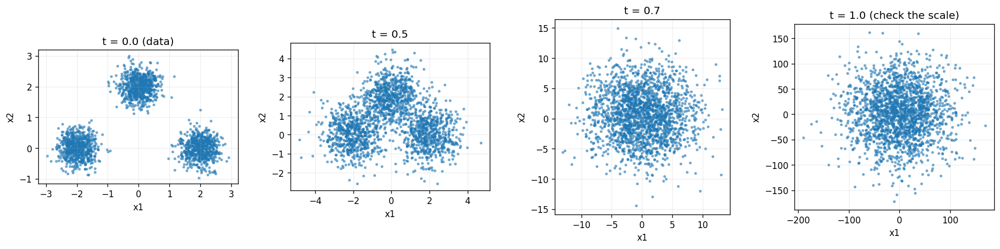

In [6]:
def sample_2d_gmm(num_samples: int = 1000):
    """
    Sample from a simple 2D Gaussian mixture.

    This is a toy "data distribution" p_0(x).
    """
    # Three cluster centers
    means = np.array([
        [2.0, 0.0],
        [-2.0, 0.0],
        [0.0, 2.0],
    ], dtype=np.float32)
    cov = 0.1 * np.eye(2, dtype=np.float32)

    num_components = len(means)
    comp_ids = np.random.randint(0, num_components, size=num_samples)

    xs = []
    for c in comp_ids:
        x = np.random.multivariate_normal(means[c], cov).astype(np.float32)
        xs.append(x)
    xs = np.stack(xs, axis=0)  # [N, 2]
    return xs


def sigma_ve(t: torch.Tensor, sigma_min: float = 0.01, sigma_max: float = 50.0) -> torch.Tensor:
    """
    Log-sigma schedule for VE SDE:

        sigma(t) = sigma_min * (sigma_max / sigma_min)**t

    Args:
        t: tensor in [0, 1], shape [N] or [N, 1]
    Returns:
        sigma(t) with same shape as t.
    """
    t = t.to(dtype=torch.float32)
    c = sigma_max / sigma_min
    return sigma_min * (c ** t)


def ve_forward_2d(
    x0: torch.Tensor,
    t: torch.Tensor,
    sigma_min: float = 0.01,
    sigma_max: float = 50.0,
) -> torch.Tensor:
    """
    Forward diffusion for VE SDE on 2D toy data:

        x_t = x_0 + sigma(t) * eps,   eps ~ N(0, I).

    Args:
        x0: clean samples, shape [N, 2]
        t: times in [0, 1], shape [N] or [N, 1]

    Returns:
        x_t: noised samples, shape [N, 2]
    """
    N = x0.size(0)

    if t.dim() == 1:
        t = t.view(N, 1)
    sigma_t = sigma_ve(t, sigma_min=sigma_min, sigma_max=sigma_max)  # [N, 1]
    eps = torch.randn_like(x0)
    x_t = x0 + sigma_t * eps
    return x_t


# Sample toy 2D data
x0_np = sample_2d_gmm(num_samples=2000)
x0 = torch.from_numpy(x0_np).to(device)

# Choose several times t
t_values = torch.tensor([0.0, 0.5, 0.7, 1.0], device=device)
labels = ["t = 0.0 (data)", "t = 0.5", "t = 0.7", "t = 1.0 (check the scale)"]

fig, axes = plt.subplots(1, len(t_values), figsize=(4 * len(t_values), 4))

for i, t_scalar in enumerate(t_values):
    t_batch = torch.full((x0.shape[0],), t_scalar.item(), device=device)
    x_t = ve_forward_2d(x0, t_batch)  # [N, 2]
    x_t_np = x_t.detach().cpu().numpy()

    ax = axes[i]
    ax.scatter(x_t_np[:, 0], x_t_np[:, 1], s=5, alpha=0.5)
    ax.set_title(labels[i])
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    ax.grid(alpha=0.2)
    ax.set_aspect("equal", "box")

plt.tight_layout()
plt.show()


### Question: what does forward diffusion do to the data?

Look at the 2D scatter plots for different times $t$.

1. How does the **overall shape** of the distribution change as $t$ goes from 0 to 1?
2. For $t$ small (for example $t = 0.5$), do you still recognize the original mixture structure?
3. For $t$ close to 1, what distribution does $x_t$ look like?
4. How would you describe the role of $\sigma(t)$ in terms of "signal to noise ratio"?

In the next sections we will introduce the **score** $\nabla_x \log p_t(x)$ of these intermediate distributions and show how it lets us run the diffusion process **backwards** to generate new samples.


**Answers**

1. At $t = 0$, the distribution is a **mixture of a few tight clusters** (each cluster is a small Gaussian around one mean).
   As $t$ increases, each cluster is convolved with a wider Gaussian, so the
   structure becomes **blurred** and the overall distribution spreads out.
   The clearly separated modes gradually merge into one big cloud.

2. For a small time like $t = 0.5$, you can still recognize the original
   cluster structure, but each cluster is **fatter**, overlaps more with its neighbors,
   and some points appear in between the original modes.

3. For $t$ close to $1$, the noise dominates:
   $x_t$ looks approximately like a **single big Gaussian blob** in $\mathbb{R}^2$,
   roughly spherical and almost independent of the detailed structure of $p_0(x)$.

4. The function $\sigma(t)$ controls how much noise has been added:
   - small $\sigma(t)$ means **high signal to noise ratio (SNR)**, so
     $x_t$ still looks similar to $x_0$,
   - large $\sigma(t)$ means **low SNR**, so $x_t$ is dominated by Gaussian noise
     and carries very little information about $x_0$.

   Forward diffusion is exactly about **increasing $\sigma(t)$ over time** until the
   data distribution has been almost completely replaced by a simple Gaussian.


### Animation:

Same as before in animation form.

Will this work on all computers on Colab? only time will tell...

In [11]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_ve_forward_2d(
    x0: torch.Tensor,
    t_min: float = 0.0,
    t_max: float = 1.0,
    dt: float = 0.05,
    sigma_min: float = 0.01,
    sigma_max: float = 50.0,
):
    """
    Animate the forward VE diffusion on 2D toy data.

    Left panel:
        - scatter plot of x_t samples evolving from t_min to t_max
          according to x_t = x_0 + sigma(t) * eps.

    Right panel:
        - noise scale sigma(t) as a function of t,
        - a red dot moves along the curve indicating the current t and sigma(t).

    Args:
        x0: clean samples, shape [N, 2], on `device`
        t_min, t_max: time range in [0, 1]
        dt: time step between animation frames (for example 0.1 or 0.05)
        sigma_min, sigma_max: parameters of the log-sigma schedule
    """
    # Time grid for animation
    times = torch.arange(t_min, t_max + 1e-6, dt, device=device)
    num_frames = times.shape[0]

    # Precompute sigma(t) curve for the right panel
    sigma_vals = sigma_ve(times, sigma_min=sigma_min, sigma_max=sigma_max)
    times_cpu = times.detach().cpu().numpy()
    sigma_cpu = sigma_vals.detach().cpu().numpy()

    # Initial frame at t = t_min
    t0 = times[0]
    t_batch0 = torch.full((x0.shape[0],), float(t0.item()), device=device)
    x_t0 = ve_forward_2d(
        x0, t_batch0, sigma_min=sigma_min, sigma_max=sigma_max
    ).detach().cpu().numpy()

    # Set up figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

    # Left: scatter of points at current time
    scatter = ax1.scatter(x_t0[:, 0], x_t0[:, 1], s=5, alpha=0.6)
    ax1.set_xlabel("x1")
    ax1.set_ylabel("x2")
    ax1.set_title(f"VE diffusion in 2D, t = {t0.item():.2f}")
    ax1.grid(alpha=0.2)
    ax1.set_aspect("equal", "box")

    # Right: sigma(t) curve + moving point
    (line2,) = ax2.plot(times_cpu, sigma_cpu, label="sigma(t)")
    point2 = ax2.scatter([times_cpu[0]], [sigma_cpu[0]], color="red", s=30, zorder=3)
    ax2.set_xlim(times_cpu[0], times_cpu[-1])
    ax2.set_ylim(0.0, sigma_cpu.max() * 1.05)
    ax2.set_xlabel("t")
    ax2.set_ylabel("sigma(t)")
    ax2.set_title("Noise scale over time")
    ax2.grid(alpha=0.3)
    ax2.legend()

    def update(frame_idx):
        # Current time
        t_current = times[frame_idx]
        t_batch = torch.full((x0.shape[0],), float(t_current.item()), device=device)

        # Forward diffusion step: x_t = x_0 + sigma(t) * eps
        x_t = ve_forward_2d(
            x0, t_batch, sigma_min=sigma_min, sigma_max=sigma_max
        ).detach().cpu().numpy()

        # Update scatter positions
        scatter.set_offsets(x_t)

        # Dynamically adjust axis limits based on current cloud
        x_min = x_t[:, 0].min() - 0.5
        x_max = x_t[:, 0].max() + 0.5
        y_min = x_t[:, 1].min() - 0.5
        y_max = x_t[:, 1].max() + 0.5
        ax1.set_xlim(x_min, x_max)
        ax1.set_ylim(y_min, y_max)

        # Update moving point on sigma(t) curve
        point2.set_offsets(
            np.array([[times_cpu[frame_idx], sigma_cpu[frame_idx]]])
        )

        # Update title with current time
        ax1.set_title(f"VE diffusion in 2D, t = {t_current.item():.2f}")

        return scatter, point2

    anim = FuncAnimation(
        fig,
        update,
        frames=num_frames,
        interval=300,  # ms between frames
        blit=True,
    )

    plt.close(fig)  # avoid showing a static image before the animation
    return HTML(anim.to_jshtml())


# Sample toy 2D data (you can adjust num_samples for speed)
x0_np = sample_2d_gmm(num_samples=2000)
x0 = torch.from_numpy(x0_np).to(device)

# Create and display the animation
html_anim = animate_ve_forward_2d(
    x0,
    t_min=0.0,
    t_max=1.0,
    dt=0.05,        # try 0.1 if you want fewer frames
    sigma_min=0.01,
    sigma_max=50.0,
)
html_anim


---

## 3. What is the score?

The central object in score-based diffusion models is the **score** of a distribution.

For a density $p_t(x)$ on $\mathbb{R}^d$, the **score function** is

$$
s_t(x) \;=\; \nabla_x \log p_t(x).
$$

For $d = 1$ this is just a derivative:

$$
s_t(x) \;=\; \frac{d}{dx} \log p_t(x).
$$

Intuition:

- The score is a **vector field** that points in the direction where $\log p_t(x)$ increases fastest.
- At a **mode** (local maximum of $p_t$), the score is zero.
- Far in the tails, the score tends to point back toward regions of higher density.

In diffusion models, we will use $s_t(x)$ to define a **reverse-time SDE** that takes us from noisy samples $x_t$ back toward samples that follow the data distribution.

Before that, we build intuition on a simple one-dimensional example.


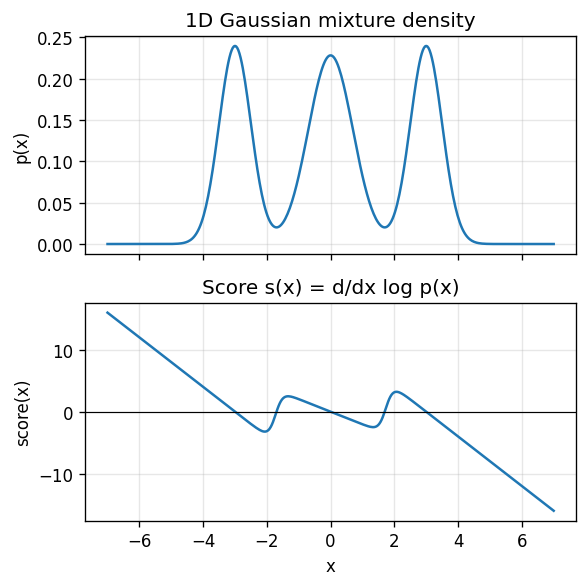

In [12]:
def gmm_1d_logp(
    x: torch.Tensor,
    means: torch.Tensor,
    sigmas: torch.Tensor,
    weights: torch.Tensor,
) -> torch.Tensor:
    """
    Log density of a 1D Gaussian mixture model:

        p(x) = sum_k w_k N(x; mu_k, sigma_k^2),

    where weights w_k >= 0 and sum_k w_k = 1.

    Args:
        x: tensor of shape [N]
        means: tensor of shape [K]
        sigmas: tensor of shape [K]
        weights: tensor of shape [K]

    Returns:
        log_p: tensor of shape [N]
    """
    # Ensure tensors are float32 on same device
    x = x.to(torch.float32)
    means = means.to(x.device).to(torch.float32)
    sigmas = sigmas.to(x.device).to(torch.float32)
    weights = weights.to(x.device).to(torch.float32)

    # Expand x to shape [N, K]
    x_exp = x.unsqueeze(1)  # [N, 1]
    means_exp = means.unsqueeze(0)  # [1, K]
    sigmas_exp = sigmas.unsqueeze(0)  # [1, K]

    var_exp = sigmas_exp ** 2

    # Log of each Gaussian component (up to normalization)
    # log N(x; mu, sigma^2) = -0.5 * ( (x-mu)^2 / sigma^2 + log(2*pi*sigma^2) )
    log_comp = -0.5 * ((x_exp - means_exp) ** 2 / var_exp + torch.log(2 * math.pi * var_exp))

    # Add log-weights and log-sum-exp over components
    log_weights = torch.log(weights).unsqueeze(0)  # [1, K]
    log_weighted = log_weights + log_comp          # [N, K]

    log_p = torch.logsumexp(log_weighted, dim=1)   # [N]
    return log_p


def gmm_1d_score(
    x: torch.Tensor,
    means: torch.Tensor,
    sigmas: torch.Tensor,
    weights: torch.Tensor,
) -> torch.Tensor:
    """
    Score of 1D Gaussian mixture, computed by automatic differentiation:

        s(x) = d/dx log p(x).

    Args:
        x: tensor of shape [N]
        means, sigmas, weights: as above

    Returns:
        score: tensor of shape [N]
    """
    x_var = x.clone().detach().requires_grad_(True)
    log_p = gmm_1d_logp(x_var, means, sigmas, weights)  # [N]
    grad = torch.autograd.grad(log_p.sum(), x_var)[0]   # [N]
    return grad


# Define a simple 1D GMM as "data distribution"
means = torch.tensor([-3.0, 0.0, 3.0])
sigmas = torch.tensor([0.5, 0.7, 0.5])
weights = torch.tensor([0.3, 0.4, 0.3])

# Grid of x values
x_grid = torch.linspace(-7.0, 7.0, steps=400)

with torch.no_grad():
    logp_grid = gmm_1d_logp(x_grid, means, sigmas, weights)
    p_grid = torch.exp(logp_grid)

score_grid = gmm_1d_score(x_grid, means, sigmas, weights)

x_np = x_grid.numpy()
p_np = p_grid.numpy()
score_np = score_grid.detach().numpy()

# Plot density and score
fig, ax = plt.subplots(2, 1, figsize=(5, 5), sharex=True)

ax[0].plot(x_np, p_np)
ax[0].set_ylabel("p(x)")
ax[0].set_title("1D Gaussian mixture density")

ax[1].plot(x_np, score_np)
ax[1].axhline(0.0, color="black", linewidth=0.7)
ax[1].set_xlabel("x")
ax[1].set_ylabel("score(x)")
ax[1].set_title("Score s(x) = d/dx log p(x)")

for a in ax:
    a.grid(alpha=0.3)

plt.tight_layout()
plt.show()


### Questions: interpreting the score on a Gaussian mixture

Look at the two plots:

- the density $p(x)$,
- the score $s(x) = \frac{d}{dx} \log p(x)$.

Try to answer these before looking at the solution.

1. What is the sign of $s(x)$ when $x$ is to the **left** of a mode?
2. What is the sign of $s(x)$ when $x$ is to the **right** of a mode?
3. What happens to $s(x)$ exactly at a mode (a local maximum of $p(x)$)?
4. In regions between two modes (for example between the left and central peaks), how does the score behave?
5. Far in the tails (for example $x \ll -7$ or $x \gg 7$), which direction does the score point and why?


**Answers**

1. To the **left** of a mode, $p(x)$ is increasing as $x$ increases, so $\log p(x)$ is also increasing.  
   The derivative $\frac{d}{dx} \log p(x)$ is **positive** there.  
   The score points to the **right**, toward the nearby mode.

2. To the **right** of a mode, $p(x)$ is decreasing as $x$ increases, so $\log p(x)$ is decreasing.  
   The derivative $\frac{d}{dx} \log p(x)$ is **negative** there.  
   The score points to the **left**, again toward the nearby mode.

3. At a mode (local maximum of $p(x)$), the slope of $\log p(x)$ is zero, so
   $$
   s(x) = \frac{d}{dx} \log p(x) = 0.
   $$
   The score **vanishes** at the mode.

4. Between two modes, the score field reflects the competition between neighboring peaks:
   - near the valley, $p(x)$ is small and the gradient of $\log p(x)$ can be quite large in magnitude,
   - the sign tells you which peak has higher influence at that location.
   Points in the valley tend to be pushed **toward whichever mode is closer or higher**.

5. In the far tails, the mixture density is dominated by the outermost Gaussian components.  
   For very negative $x$, the closest high-density region is to the **right**, so $s(x) > 0$ and the score points right.  
   For very positive $x$, the closest high-density region is to the **left**, so $s(x) < 0$ and the score points left.

   In words: in the tails, **the score always points back toward the bulk of the distribution**.

---


## 4. Reverse diffusion as a flow guided by the score

So far we have:

- A **forward diffusion process** (for example the VE SDE)
  that turns data $x_0 \sim p_0(x)$ into progressively noisier samples $x_t$.
- A **score field** $s_t(x) = \nabla_x \log p_t(x)$ that tells us, at each time $t$,
  in which direction density increases most.

A key theoretical result (Anderson 1982, used by Song et al.) is:

> If $x_t$ follows the forward SDE
> $$
> d\mathbf{x}_t = \mathbf{f}(\mathbf{x}_t, t)\, dt + g(t)\, d\mathbf{w}_t,
> $$
> then running the process **backwards in time** satisfies a **reverse-time SDE**
> $$
> d\mathbf{x}_t
> = \big[\mathbf{f}(\mathbf{x}_t, t) - g(t)^2 \nabla_x \log p_t(\mathbf{x}_t)\big]\, dt
>   + g(t)\, d\bar{\mathbf{w}}_t,
> $$
> where $p_t$ is the marginal density of $\mathbf{x}_t$ and $\bar{\mathbf{w}}_t$ is a Brownian motion in reverse time.

The important part for us:

- The **score** $\nabla_x \log p_t(x)$ appears explicitly in the **drift** of the reverse SDE.
- If we know $s_t(x)$ for all $t$, we can simulate this reverse SDE and transform a simple noisy distribution
  (for example a Gaussian at large $t$) back into something that matches the **data distribution** at $t = 0$.

In this section we will not simulate the full SDE with time-dependent coefficients.
Instead, we will build intuition on a 1D toy density by using the score as a **flow field** that moves a cloud of points toward high-density regions.
This is a simplified picture of what the reverse SDE is doing.


In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_score_flow_1d(
    means: torch.Tensor,
    sigmas: torch.Tensor,
    weights: torch.Tensor,
    num_particles: int = 2000,
    num_steps: int = 80,
    step_size: float = 0.05,
    x_min: float = -7.0,
    x_max: float = 7.0,
):
    """
    Animate a simple "score flow" on a 1D Gaussian mixture:

    - Target density is p(x): a 1D GMM with known log p(x) and score s(x) = d/dx log p(x).
    - We start particles from a broad Gaussian (far from the target distribution).
    - At each step we move x by a small step in the direction of the score:

          x <- x + step_size * s(x)

      which is like gradient ascent on log p(x).

    This is a simplified, deterministic analogue of what the reverse SDE or probability-flow ODE
    would do in diffusion models.

    Args:
        means, sigmas, weights: parameters of the 1D GMM (same as before)
        num_particles: number of particles to simulate
        num_steps: number of gradient steps
        step_size: step size along the score direction
        x_min, x_max: plotting range
    """
    # Precompute the true density curve for plotting
    x_grid = torch.linspace(x_min, x_max, steps=400)
    with torch.no_grad():
        logp_grid = gmm_1d_logp(x_grid, means, sigmas, weights)
        p_grid = torch.exp(logp_grid)
    x_grid_np = x_grid.numpy()
    p_grid_np = p_grid.numpy()

    # Initialize particles from a broad Gaussian "prior"
    # so they do not initially follow p(x)
    x = torch.randn(num_particles) * 10.0  # N(0, 10^2)

    # Set up the figure
    fig, ax = plt.subplots(figsize=(5, 3))

    # Initial histogram
    ax.hist(
        x.detach().numpy(),
        bins=80,
        range=(x_min, x_max),
        density=True,
        alpha=0.6,
        label="particles",
    )
    ax.plot(x_grid_np, p_grid_np, "k-", linewidth=1.5, label="target density p(x)")
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(0.0, p_grid_np.max() * 1.2)
    ax.set_xlabel("x")
    ax.set_ylabel("density")
    ax.set_title("Score flow step 0")
    ax.grid(alpha=0.3)
    ax.legend()

    def update(frame_idx):
        nonlocal x

        # One gradient-ascent step along the score field
        x = x.detach()  # detach from any previous graph
        x.requires_grad_(True)
        score = gmm_1d_score(x, means, sigmas, weights)  # s(x) = d/dx log p(x)

        with torch.no_grad():
            x = (x + step_size * score).detach()  # move along score and detach

        # Update histogram
        ax.clear()
        ax.hist(
            x.detach().numpy(),
            bins=80,
            range=(x_min, x_max),
            density=True,
            alpha=0.6,
            label="particles",
        )
        ax.plot(x_grid_np, p_grid_np, "k-", linewidth=1.5, label="target density p(x)")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(0.0, p_grid_np.max() * 1.2)
        ax.set_xlabel("x")
        ax.set_ylabel("density")
        ax.set_title(f"Score flow step {frame_idx + 1}")
        ax.grid(alpha=0.3)
        ax.legend()

        return []

    anim = FuncAnimation(
        fig,
        update,
        frames=num_steps,
        interval=200,  # ms between frames
        blit=False,
    )

    plt.close(fig)  # avoid showing a static image before the animation
    return HTML(anim.to_jshtml())


# Run the animation (reusing means, sigmas, weights from before)
html_score_flow = animate_score_flow_1d(
    means=means,
    sigmas=sigmas,
    weights=weights,
    num_particles=2000,
    num_steps=80,
    step_size=0.05,
    x_min=-7.0,
    x_max=7.0,
)
html_score_flow


### Question 4.1: what is the score doing here?

Watch the animation of the 1D "score flow" a couple of times.

1. At the beginning (step 0), how does the particle distribution compare to the target density $p(x)$?
2. As the steps progress, how does the particle histogram change relative to the curve $p(x)$?
3. Around half of the animation, where do particles tend to concentrate, and why?
4. What do you think would happen if the step size were:
   - much smaller,
   - much larger?
5. In a full diffusion model, we also add noise at each step (Langevin or reverse SDE).  
   Qualitatively, what extra role do you think the noise plays compared to this purely deterministic gradient flow?


**Answers**

1. At step 0, the particles come from a broad Gaussian (for example $X \sim \mathcal{N}(0, 10^2)$), so the histogram is
   quite spread out and does **not** match the target mixture $p(x)$ at all. It may have only a single wide peak,
   while $p(x)$ has several distinct modes.

2. As the steps progress, each particle moves a little bit in the direction of the local score:
   $$
   x \leftarrow x + \text{step\_size} \cdot s(x), \quad s(x) = \frac{d}{dx} \log p(x).
   $$
   This means particles tend to drift **toward regions where $p(x)$ is larger**.  
   The histogram gradually reshapes: some mass moves away from the low-density tails and valleys, and more mass
   accumulates near the peaks of $p(x)$.

3. Around half the animation, particles tend to concentrate around the **modes of the Gaussian mixture** (the peaks of $p(x)$).  
   At those points the score is close to zero (since $\log p(x)$ has a local maximum), so particles slow down and
   tend to stay there. This is exactly what we expect from gradient ascent on $\log p(x)$.

4. Step size effects:
   - If the step size is **much smaller**, each update is tiny. The flow will move particles more slowly,
     and you may need many more steps to get close to $p(x)$. The evolution is smoother and more stable.
   - If the step size is **much larger**, the updates can overshoot the modes, making the trajectories unstable.
     The histogram may oscillate, look noisy, or even diverge instead of settling near the target density.

5. In a full diffusion model, we combine the **score-based drift** with **noise** at each step (for example in Langevin
   dynamics or a reverse SDE). The noise has two important effects:
   - It helps **explore** the space instead of collapsing deterministically to a few attractors. Different runs from
     the same starting distribution can lead to different samples.
   - It nudges the dynamics toward the **correct stationary or time-marginal distributions** under assumptions from
     the underlying SDE. In other words, drift plus noise together can reproduce the full stochastic behavior of the
     reverse diffusion, not just a deterministic "mode-seeking" flow.

   In practice, score-based generative models carefully balance these two parts (drift from the score, plus noise) to
   transform a simple distribution (for example a Gaussian at large $t$) into realistic samples from the data distribution.

---


## 5. Learning the score by denoising

So far:

- We defined a **forward diffusion process** (VE SDE) that maps $x_0 \sim p_0(x)$ to noisier $x_t$.
- We saw the **score** $s_t(x) = \nabla_x \log p_t(x)$ and how a score flow pushes samples toward high-density regions.

In a real dataset we **do not know** $p_t(x)$ in closed form, so we cannot compute $s_t(x)$ directly.

However, in many forward processes used in diffusion models we *do* know the **conditional** distribution
of $x_t$ given $x_0$.

For the VE SDE we use in this notebook:

$$
x_t = x_0 + \sigma(t)\, \epsilon, \quad \epsilon \sim \mathcal{N}(0, I).
$$

So conditionally on $x_0$ we have

$$
x_t \mid x_0 \sim \mathcal{N}\big(x_0, \sigma(t)^2 I\big).
$$

The **conditional score** is easy to compute:

$$
\nabla_{x_t} \log p(x_t \mid x_0)
= -\frac{1}{\sigma(t)^2} \big(x_t - x_0\big).
$$

A key fact (Vincent 2011, used by Song et al.) is:

> If you train a model $s_\theta(x_t, t)$ to predict the **conditional score**
> $\nabla_{x_t} \log p(x_t \mid x_0)$ from noisy samples $(x_0, x_t)$,  
> then under mild conditions you also learn the **marginal score**:
> $$
> s_\theta(x_t, t) \approx \nabla_{x_t} \log p_t(x_t).
> $$

The trick is to pose a **denoising objective**:

1. Sample $x_0 \sim p_0(x)$ (from the data).
2. Sample a time $t$ and noise $\epsilon \sim \mathcal{N}(0, I)$.
3. Construct a noisy example
   $$
   x_t = x_0 + \sigma(t)\, \epsilon.
   $$
4. Train $s_\theta(x_t, t)$ to match the known conditional score
   $$
   s^\star(x_t, t, x_0)
   = -\frac{1}{\sigma(t)^2} \big(x_t - x_0\big).
   $$

In this section you will implement a **toy 2D denoising score matching (DSM)** experiment:

- Use the same 2D Gaussian mixture as our "data distribution" $p_0(x)$.
- Simulate noisy samples $x_t$ using the VE forward process.
- Train a small neural network to predict the conditional score from $(x_t, t)$.
- Visualize the learned score field and compare it to the **true** score of the 2D mixture.


### 5.1 Denoising score matching objective

We now write the loss we will minimize.

For the VE forward process
$$
x_t = x_0 + \sigma(t)\, \epsilon, \quad \epsilon \sim \mathcal{N}(0, I),
$$
the conditional score is
$$
s^\star(x_t, t, x_0)
= \nabla_{x_t} \log p(x_t \mid x_0)
= -\frac{1}{\sigma(t)^2} \big(x_t - x_0\big).
$$

We define a model $s_\theta(x_t, t)$ and minimize the **denoising score matching loss**:

$$
\mathcal{L}_{\text{DSM}}(\theta)
= \mathbb{E}_{x_0 \sim p_0}
  \mathbb{E}_{t}
  \mathbb{E}_{x_t \mid x_0}
  \Big[
    \big\| s_\theta(x_t, t)
          - s^\star(x_t, t, x_0)
    \big\|_2^2
  \Big].
$$

In practice:

- we approximate the expectations by sampling mini-batches,
- we compute $s^\star(x_t, t, x_0)$ using the **closed form** above,
- we backpropagate through $s_\theta$ to update $\theta$.

In real diffusion models, this objective is applied in very high dimension (for images),
with a much larger network. Here we stay in 2D, so we can **see** both the true and learned score fields.


In [17]:
def gmm_2d_logp(
    x: torch.Tensor,
    means: torch.Tensor,
    sigmas: torch.Tensor,
    weights: torch.Tensor,
) -> torch.Tensor:
    """
    Log density of a 2D Gaussian mixture model:

        p(x) = sum_k w_k N(x; mu_k, sigma_k^2 I),

    where x in R^2, w_k >= 0, sum_k w_k = 1.

    Args:
        x: tensor of shape [N, 2]
        means: tensor of shape [K, 2]
        sigmas: tensor of shape [K]  (isotropic std per component)
        weights: tensor of shape [K]

    Returns:
        log_p: tensor of shape [N]
    """
    x = x.to(torch.float32)
    means = means.to(x.device).to(torch.float32)  # [K, 2]
    sigmas = sigmas.to(x.device).to(torch.float32)  # [K]
    weights = weights.to(x.device).to(torch.float32)  # [K]

    N = x.size(0)
    K = means.size(0)
    d = x.size(1)  # should be 2

    # Expand dimensions for broadcasting
    x_exp = x.unsqueeze(1)          # [N, 1, 2]
    means_exp = means.unsqueeze(0)  # [1, K, 2]
    sigmas_exp = sigmas.view(1, K, 1)  # [1, K, 1]

    var_exp = sigmas_exp ** 2       # [1, K, 1]

    # Squared Mahalanobis distance (isotropic)
    diff = x_exp - means_exp        # [N, K, 2]
    quad = (diff ** 2 / var_exp).sum(dim=2)  # [N, K]

    # log N(x; mu, sigma^2 I) = -0.5 * (quad + d * log(2*pi*sigma^2))
    log_norm = -0.5 * d * torch.log(2 * math.pi * var_exp.squeeze(2))  # [1, K]
    log_comp = -0.5 * quad + log_norm  # [N, K]

    log_weights = torch.log(weights).view(1, K)  # [1, K]
    log_weighted = log_weights + log_comp        # [N, K]

    log_p = torch.logsumexp(log_weighted, dim=1)  # [N]
    return log_p


def gmm_2d_score(
    x: torch.Tensor,
    means: torch.Tensor,
    sigmas: torch.Tensor,
    weights: torch.Tensor,
) -> torch.Tensor:
    """
    True score of 2D Gaussian mixture:

        s(x) = ∇_x log p(x),

    computed by automatic differentiation.

    Args:
        x: tensor of shape [N, 2]

    Returns:
        score: tensor of shape [N, 2]
    """
    x_var = x.clone().detach().requires_grad_(True)
    log_p = gmm_2d_logp(x_var, means, sigmas, weights)  # [N]
    grad = torch.autograd.grad(log_p.sum(), x_var)[0]   # [N, 2]
    return grad


# Define a 2D GMM that roughly matches sample_2d_gmm
means_2d = torch.tensor([
    [2.0, 0.0],
    [-2.0, 0.0],
    [0.0, 2.0],
])
sigmas_2d = torch.tensor([0.3, 0.3, 0.3])
weights_2d = torch.tensor([1.0, 1.0, 1.0])
weights_2d = weights_2d / weights_2d.sum()


In [18]:
class ScoreNet2D(nn.Module):
    """
    Small MLP to approximate the score s_theta(x_t, t) in 2D.

    We condition on time through log sigma:

        input = concat( x_t, log_sigma(t) ).
    """
    def __init__(self, hidden_dim: int = 128):
        super().__init__()
        self.fc1 = nn.Linear(2 + 1, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, 2)
        self.act = nn.SiLU()  # smooth nonlinearity

    def forward(self, x_t: torch.Tensor, log_sigma: torch.Tensor) -> torch.Tensor:
        """
        Args:
            x_t: noisy samples, shape [N, 2]
            log_sigma: log sigma(t), shape [N] or [N, 1]

        Returns:
            score_pred: predicted score, shape [N, 2]
        """
        if log_sigma.dim() == 1:
            log_sigma = log_sigma.unsqueeze(1)  # [N, 1]

        h = torch.cat([x_t, log_sigma], dim=1)  # [N, 3]
        h = self.act(self.fc1(h))
        h = self.act(self.fc2(h))
        score_pred = self.fc3(h)
        return score_pred


score_model = ScoreNet2D(hidden_dim=128).to(device)
optimizer = torch.optim.Adam(score_model.parameters(), lr=1e-3)


In [42]:
from tqdm.auto import tqdm

def sample_dsm_batch_2d(
    batch_size: int,
    t_min: float = 0.0,
    t_max: float = 1.0,
    sigma_min: float = 0.01,
    sigma_max: float = 1.0,
) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
    """
    Sample a mini-batch for DSM training in 2D.

    Steps:
      1. x0 ~ p_0 (2D GMM).
      2. t ~ Uniform(t_min, t_max).
      3. sigma(t) from VE schedule.
      4. eps ~ N(0, I), x_t = x0 + sigma(t) * eps.
      5. target score s_star(x_t, t, x0) = -(x_t - x0) / sigma(t)^2.

    Returns:
      x_t: noisy samples, [B, 2]
      t: times, [B]
      log_sigma: log sigma(t), [B]
      score_target: target scores, [B, 2]
    """
    # 1. sample clean data x0
    x0_np = sample_2d_gmm(num_samples=batch_size)
    x0 = torch.from_numpy(x0_np).to(device)  # [B, 2]

    # 2. sample times
    t = torch.rand(batch_size, device=device) * (t_max - t_min) + t_min  # [B]

    # 3. sigma(t)
    sigma_t = sigma_ve(t, sigma_min=sigma_min, sigma_max=sigma_max)  # [B]
    log_sigma = torch.log(sigma_t + 1e-8)  # [B]

    # 4. noisy samples
    eps = torch.randn_like(x0)  # [B, 2]
    sigma_t_expanded = sigma_t.view(batch_size, 1)  # [B, 1]
    x_t = x0 + sigma_t_expanded * eps  # [B, 2]

    # 5. target conditional score
    score_target = -(x_t - x0) / (sigma_t_expanded ** 2 + 1e-8)  # [B, 2]

    return x_t, t, log_sigma, score_target


def train_score_model_2d(
    model: nn.Module,
    optimizer: torch.optim.Optimizer,
    num_steps: int = 3000,
    batch_size: int = 256,
    print_every: int = 500,
    t_min: float = 0.0,
    t_max: float = 1.0,
    sigma_min: float = 0.01,
    sigma_max: float = 1.0,
    collect_snapshots: bool = True,
    num_snapshots: int = 20,
    snapshot_t_eval: float = 0.5,
    snapshot_x_min: float = -4.0,
    snapshot_x_max: float = 4.0,
    snapshot_y_min: float = -4.0,
    snapshot_y_max: float = 4.0,
    snapshot_grid_size: int = 15,
):
    """
    Train the 2D score network with DSM.

    Loss:
        L = E[ || s_theta(x_t, t) - s_star(x_t, t, x0) ||^2 ]

    If collect_snapshots is True, also record num_snapshots quiver fields
    of the learned score at a fixed time snapshot_t_eval on a fixed grid.
    These snapshots will be used to animate how the vector field evolves
    during training.

    Returns:
        snapshots: list of dicts, each with keys
            'step', 'X', 'Y', 'U', 'V'
        where X, Y, U, V are numpy arrays of shape [G, G].
    """
    model.train()
    snapshots = []

    if collect_snapshots:
        # Choose at which training steps to save the score field
        snapshot_steps = np.linspace(1, num_steps, num_snapshots, dtype=int)
        snapshot_steps = sorted(set(int(s) for s in snapshot_steps))
        snapshot_steps_set = set(snapshot_steps)

        # Precompute grid for the score field
        xs = torch.linspace(snapshot_x_min, snapshot_x_max, steps=snapshot_grid_size)
        ys = torch.linspace(snapshot_y_min, snapshot_y_max, steps=snapshot_grid_size)
        X_grid, Y_grid = torch.meshgrid(xs, ys, indexing="xy")  # [G, G]
        xy_grid = torch.stack(
            [X_grid.reshape(-1), Y_grid.reshape(-1)],
            dim=1,
        ).to(device)  # [G^2, 2]

        X_grid_np = X_grid.detach().cpu().numpy()
        Y_grid_np = Y_grid.detach().cpu().numpy()

    for step in tqdm(range(1, num_steps + 1), desc="Training 2D score net"):
        x_t, t, log_sigma, score_target = sample_dsm_batch_2d(
            batch_size=batch_size,
            t_min=t_min,
            t_max=t_max,
            sigma_min=sigma_min,
            sigma_max=sigma_max,
        )

        x_t = x_t.to(device)
        log_sigma = log_sigma.to(device)
        score_target = score_target.to(device)

        optimizer.zero_grad()
        score_pred = model(x_t, log_sigma)  # [B, 2]

        loss = ((score_pred - score_target) ** 2).sum(dim=1).mean()
        loss.backward()
        optimizer.step()

        if step % print_every == 0:
            print(f"[DSM] Step {step:4d}/{num_steps}, loss = {loss.item():.4f}")

        # Save a snapshot of the learned score field at some training steps
        if collect_snapshots and step in snapshot_steps_set:
            with torch.no_grad():
                t_grid = torch.full(
                    (xy_grid.size(0),),
                    snapshot_t_eval,
                    device=device,
                )
                sigma_grid = sigma_ve(t_grid, sigma_min=sigma_min, sigma_max=sigma_max)
                log_sigma_grid = torch.log(sigma_grid + 1e-8)

                score_grid = model(xy_grid, log_sigma_grid)  # [G^2, 2]
                U = score_grid[:, 0].reshape(snapshot_grid_size, snapshot_grid_size).cpu().numpy()
                V = score_grid[:, 1].reshape(snapshot_grid_size, snapshot_grid_size).cpu().numpy()

            snapshots.append(
                {
                    "step": step,
                    "X": X_grid_np,
                    "Y": Y_grid_np,
                    "U": U,
                    "V": V,
                }
            )

    return snapshots


score_model = ScoreNet2D(hidden_dim=128).to(device)
optimizer = torch.optim.Adam(score_model.parameters(), lr=1e-3)

print("Training small 2D score network with DSM...")
score_snapshots = train_score_model_2d(
    score_model,
    optimizer,
    num_steps=5000,
    batch_size=128,
    print_every=500,
    t_min=0.0,
    t_max=1.0,
    sigma_min=0.01,
    sigma_max=1.0,
    collect_snapshots=True,
    num_snapshots=20,
    snapshot_t_eval=0.5,
    snapshot_x_min=-4.0,
    snapshot_x_max=4.0,
    snapshot_y_min=-4.0,
    snapshot_y_max=4.0,
    snapshot_grid_size=15,
)
print(f"Collected {len(score_snapshots)} score-field snapshots.")


Training small 2D score network with DSM...


Training 2D score net:   0%|          | 0/5000 [00:00<?, ?it/s]

[DSM] Step  500/5000, loss = 1340.0826
[DSM] Step 1000/5000, loss = 985.9998
[DSM] Step 1500/5000, loss = 1939.9199
[DSM] Step 2000/5000, loss = 1598.1477
[DSM] Step 2500/5000, loss = 1559.1462
[DSM] Step 3000/5000, loss = 2874.2976
[DSM] Step 3500/5000, loss = 2499.2969
[DSM] Step 4000/5000, loss = 2003.6699
[DSM] Step 4500/5000, loss = 2993.2759
[DSM] Step 5000/5000, loss = 2382.6545
Collected 20 score-field snapshots.


In [46]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_score_field_training_2d(
    snapshots,
    t_eval: float = 0.5,
    x_min: float = -4.0,
    x_max: float = 4.0,
    y_min: float = -4.0,
    y_max: float = 4.0,
):
    """
    Animate how the learned 2D score field evolves during training.

    Left panel:
      - true score field ∇_x log p(x) of the 2D GMM (static),
      - colored by vector norm.

    Right panel:
      - learned score s_theta(x, t_eval) on the same grid,
      - evolves over training using the saved snapshots,
      - colored by vector norm using the same color scale.

    Both panels have background contours of the target density p(x).
    """
    if len(snapshots) == 0:
        print("No snapshots to animate. Did you set collect_snapshots=True?")
        return

    # Precompute background density p(x) on a finer grid for contours
    xs_bg = torch.linspace(x_min, x_max, steps=100)
    ys_bg = torch.linspace(y_min, y_max, steps=100)
    X_bg, Y_bg = torch.meshgrid(xs_bg, ys_bg, indexing="xy")

    xy_bg = torch.stack(
        [X_bg.reshape(-1), Y_bg.reshape(-1)],
        dim=1,
    ).to(device)  # [100^2, 2]

    with torch.no_grad():
        logp_bg = gmm_2d_logp(xy_bg, means_2d, sigmas_2d, weights_2d)
        p_bg = torch.exp(logp_bg)

    P_bg = p_bg.reshape(100, 100).cpu().numpy()
    X_bg_np = X_bg.detach().cpu().numpy()
    Y_bg_np = Y_bg.detach().cpu().numpy()

    # Use the first snapshot grid to compute the TRUE score field on the same locations
    snap0 = snapshots[0]
    X = snap0["X"]  # [G, G]
    Y = snap0["Y"]  # [G, G]
    Gx, Gy = X.shape

    xy_grid = torch.stack(
        [torch.from_numpy(X).reshape(-1),
         torch.from_numpy(Y).reshape(-1)],
        dim=1,
    ).to(device)  # [G^2, 2]

    with torch.enable_grad():
        score_true = gmm_2d_score(xy_grid, means_2d, sigmas_2d, weights_2d)  # [G^2, 2]
    score_true = score_true.detach()

    U_true = score_true[:, 0].reshape(Gx, Gy).cpu().numpy()
    V_true = score_true[:, 1].reshape(Gx, Gy).cpu().numpy()
    norm_true = np.sqrt(U_true**2 + V_true**2)

    # Norms for learned snapshots (for global color scale)
    norms_learned = [np.sqrt(s["U"]**2 + s["V"]**2) for s in snapshots]
    max_norm_learned = max(n.max() for n in norms_learned)
    max_norm_true = norm_true.max()
    max_norm = max(max_norm_true, max_norm_learned)

    # Initial learned field (first snapshot)
    U0 = snap0["U"]
    V0 = snap0["V"]
    C0 = norms_learned[0]

    # Shared normalization so colors are comparable across time and with true field
    norm = plt.Normalize(vmin=0.0, vmax=max_norm)

    # Figure with two panels: true (left) and learned (right)
    fig, (ax_true, ax_learned) = plt.subplots(1, 2, figsize=(10, 5))

    # --- Left: true score field ---

    ax_true.contour(
        X_bg_np,
        Y_bg_np,
        P_bg,
        levels=8,
        alpha=0.4,
    )

    q_true = ax_true.quiver(
        X,
        Y,
        U_true,
        V_true,
        norm_true,
        cmap="viridis",
        norm=norm,
        angles="xy",
        scale_units="xy",
        scale=10.0,
    )

    ax_true.set_xlim(x_min, x_max)
    ax_true.set_ylim(y_min, y_max)
    ax_true.set_xlabel("x1")
    ax_true.set_ylabel("x2")
    ax_true.set_aspect("equal", "box")
    ax_true.grid(alpha=0.2)
    ax_true.set_title("True score field (data GMM)")

    # --- Right: learned score field (animated) ---

    ax_learned.contour(
        X_bg_np,
        Y_bg_np,
        P_bg,
        levels=8,
        alpha=0.4,
    )

    q_learned = ax_learned.quiver(
        X,
        Y,
        U0,
        V0,
        C0,
        cmap="viridis",
        norm=norm,
        angles="xy",
        scale_units="xy",
        scale=10.0,
    )

    ax_learned.set_xlim(x_min, x_max)
    ax_learned.set_ylim(y_min, y_max)
    ax_learned.set_xlabel("x1")
    ax_learned.set_ylabel("x2")
    ax_learned.set_aspect("equal", "box")
    ax_learned.grid(alpha=0.2)
    ax_learned.set_title(
        f"Learned score field at t = {t_eval:.2f}, iter {snap0['step']}"
    )

    # One shared colorbar for "norm of score"
    cbar = fig.colorbar(q_learned, ax=[ax_true, ax_learned], shrink=0.8)
    cbar.set_label("norm of score")

    def update(frame_idx):
        snap = snapshots[frame_idx]
        U = snap["U"]
        V = snap["V"]
        C = np.sqrt(U**2 + V**2)

        # Update learned quiver vectors and colors
        q_learned.set_UVC(U, V, C)
        q_learned.set_array(C.ravel())

        ax_learned.set_title(
            f"Learned score field at t = {t_eval:.2f}, iter {snap['step']}"
        )
        return q_learned,

    anim = FuncAnimation(
        fig,
        update,
        frames=len(snapshots),
        interval=400,
        blit=False,
    )

    plt.close(fig)
    return HTML(anim.to_jshtml())


# Create and display the animation of training
html_score_field_anim = animate_score_field_training_2d(
    score_snapshots,
    t_eval=0.1, # Change this value to 0.3, 0.5, 0.8, etc.
    x_min=-4.0,
    x_max=4.0,
    y_min=-4.0,
    y_max=4.0,
)
html_score_field_anim


### Question 5.1: what did the network actually learn?

Look at the true vs learned score fields at some time $t$ (for example $t = 0.1$).

1. In which regions of the plane do the two vector fields look most similar?
2. Near the modes of the Gaussian mixture, how well does the learned score align with the true score?
3. In very low-density regions (far away from the clusters), do you expect the learned score to be accurate?
   Why might it be harder to learn there?
4. Why is it *useful* that the model learns the score as a function of both $x_t$ and $t$ (or $\sigma(t)$),
   instead of just $x_t$?
5. Relate this objective to the DDPM view: if we write $x_t = \sqrt{\alpha_t}\, x_0 + \sqrt{1 - \alpha_t}\, \epsilon$,
   which quantity is the network trying to predict in most practical DDPM implementations?


**Answers**

1. The two vector fields tend to match best in regions where we see **many training samples**:
   around and between the main Gaussian clusters. There the model gets lots of examples of
   $(x_0, t, x_t)$, so the DSM loss gives strong learning signal and the network can fit the score well.

2. Near the modes of the mixture, the true score is close to zero (local maxima of $p(x)$), and the
   surrounding vectors point inward toward the peaks. A well-trained model should show:
   - small vectors near the centers of the clusters,
   - arrows pointing toward the centers just around them.
   If the learned field displays this pattern, it means the network has captured the local geometry
   of the density near the modes.

3. In very low-density regions (far away from the clusters), we have **few or no training samples**.
   The DSM objective rarely sees $x_t$ in those regions, so the model receives almost no gradient information there.
   As a result, the learned score is often inaccurate or noisy in the far tails. This is expected: the model mainly
   focuses on regions where the data (and noised data) actually live.

4. The forward process changes the **noise level** over time:
   - for small $t$, $\sigma(t)$ is small and $x_t$ is close to $x_0$,
   - for large $t$, $\sigma(t)$ is large and $x_t$ is dominated by noise.

   The **shape of $p_t(x)$ and its score** $\nabla_x \log p_t(x)$ changes with $t$. By giving the model access
   to $t$ (or $\log \sigma(t)$), we let it learn **different score fields at different noise levels** with a
   single set of parameters:
   $$
   s_\theta(x_t, t) \approx \nabla_{x_t} \log p_t(x_t)
   $$
   for all $t \in [0, 1]$.
   This is exactly what we need to run a reverse SDE or a time-discretized sampler.

5. In DDPM notation, the forward process is
   $$
   x_t = \sqrt{\bar{\alpha}_t}\, x_0 + \sqrt{1 - \bar{\alpha}_t}\, \epsilon,
   \quad \epsilon \sim \mathcal{N}(0, I).
   $$
   Most implementations train a network $\epsilon_\theta(x_t, t)$ to predict the **added noise** $\epsilon$,
   with a loss like
   $$
   \mathbb{E}\big[\|\epsilon - \epsilon_\theta(x_t, t)\|^2\big].
   $$
   This is closely related to DSM:

   - For Gaussian perturbations, the conditional score can be written in terms of $\epsilon$ and $x_t$.
   - Predicting $\epsilon$ is therefore equivalent (up to known scaling factors) to predicting the score
     $\nabla_{x_t} \log p_t(x_t)$.

   So the DDPM "predict the noise at each pixel" view is just a **reparameterization** of the same underlying
   score matching objective you implemented here in 2D.

---

## 6. Continuous SDE vs DDPM forward diffusion

So far we have mostly worked with **continuous-time SDEs** (like the VE SDE) and their
closed-form conditionals, which we used for denoising score matching.

DDPMs are usually written in **discrete time**, but they are closely related to a
continuous-time SDE called the **variance-preserving (VP) SDE**.



### 6.1.1 VP SDE (continuous time)

A common forward SDE used in score-based models is the VP SDE:

$$
d x_t
= - \tfrac{1}{2} \beta(t) \, x_t \, dt
  + \sqrt{\beta(t)} \, dW_t,
$$

where:

- $x_t \in \mathbb{R}^d$ is the state at time $t$,
- $\beta(t) \ge 0$ is a noise schedule,
- $W_t$ is standard Brownian motion.

For Gaussian data $x_0 \sim \mathcal{N}(0, I)$ and suitable $\beta(t)$, the process
can be chosen so that the marginals $p_t(x)$ remain approximately Gaussian with
bounded variance ("variance-preserving").



### 6.1.2 DDPM forward process (discrete time)

DDPMs define a Markov chain:

$$
q(x_t \mid x_{t-1})
= \mathcal{N}\big(
    x_t;
    \sqrt{\alpha_t} \, x_{t-1},
    (1 - \alpha_t) I
  \big),
$$

where:

- $\beta_t \in (0, 1)$ is a discrete noise schedule,
- $\alpha_t = 1 - \beta_t$,
- $\bar{\alpha}_t = \prod_{s=1}^t \alpha_s$.

By composing the steps, we get the **closed form conditional** used in DDPM:

$$
q(x_t \mid x_0)
= \mathcal{N}\big(
    x_t;
    \sqrt{\bar{\alpha}_t} \, x_0,
    (1 - \bar{\alpha}_t) I
  \big).
$$

This has exactly the same structure as the conditionals we used for DSM:

- a **scaled data term** plus
- **Gaussian noise** with variance controlled by a schedule.



### 6.1.3 Mapping between SDE and DDPM viewpoints

We can summarize the analogy:

| aspect                        | continuous VP SDE                                         | discrete DDPM forward                                             |
|------------------------------|-----------------------------------------------------------|-------------------------------------------------------------------|
| state                        | $x_t$                                                     | $x_t$                                                             |
| time                         | continuous $t \in [0, T]$                                 | discrete steps $t = 0, 1, \dots, T$                              |
| dynamics                     | $d x_t = f(x_t, t) dt + g(t) dW_t$                       | $x_t = \sqrt{\alpha_t} x_{t-1} + \sqrt{1 - \alpha_t} \, \epsilon_t$ |
| noise schedule               | $g(t)$ or $\beta(t)$                                      | $\{\beta_t\}_t$ or $\{\alpha_t, \bar{\alpha}_t\}_t$              |
| conditional $x_t \mid x_0$   | Gaussian with known mean and covariance (from SDE)        | $q(x_t \mid x_0)$ as above                                        |

For small time steps and smooth $\beta(t)$, there is a precise way to choose
$\beta_t$ so that the discrete DDPM chain **approximates** the continuous VP SDE
in the limit of many steps. We will not prove that here, but we can illustrate
numerically that a simple VP SDE and a DDPM-style chain can have **very similar
marginals** if we choose the schedules consistently.

This is the main message:

- continuous-time viewpoint: SDE with drift and diffusion,
- discrete-time viewpoint: DDPM with $\alpha_t$ and $\beta_t$,
- both induce Gaussian conditionals that we can use for **denoising and score learning**.


In [49]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import math

# Parameters shared by both processes
beta_vp = 1.0       # constant noise rate beta(t) = beta_vp
T_vp = 1.0          # final "time"
N_steps_vp = 1000   # number of steps for SDE discretization
dt_vp = T_vp / N_steps_vp

num_particles = 20000  # number of Monte Carlo samples

def simulate_forward_vp_sde_1d(
    x0: torch.Tensor,
    beta: float = beta_vp,
    T: float = T_vp,
    N_steps: int = N_steps_vp,
):
    """
    Forward VP SDE in 1D:

        dx_t = -0.5 * beta * x_t dt + sqrt(beta) dW_t.

    Euler-Maruyama discretization:

        x_{k+1} = x_k + (-0.5 beta x_k) dt + sqrt(beta) sqrt(dt) eps_k.

    Args:
        x0: initial samples, shape [N]
    Returns:
        xs: list of tensors [x_t0, x_t1, ..., x_tK] at selected times
        ts: list of times corresponding to xs
    """
    x = x0.clone().to(device)
    dt = T / N_steps
    sqrt_dt = math.sqrt(dt)

    # Choose a few time indices to store (including t=0 and t=T)
    idxs = [0, N_steps // 4, N_steps // 2, 3 * N_steps // 4, N_steps]
    idxs = sorted(set(idxs))

    xs = []
    ts = []

    for k in range(N_steps + 1):
        if k in idxs:
            xs.append(x.detach().cpu().clone())
            t = k * dt
            ts.append(t)

        if k == N_steps:
            break

        eps = torch.randn_like(x)
        x = x + (-0.5 * beta * x) * dt + math.sqrt(beta) * sqrt_dt * eps

    return xs, ts

def simulate_forward_ddpm_1d(
    x0: torch.Tensor,
    beta: float = beta_vp,
    T: float = T_vp,
    N_steps: int = N_steps_vp,
):
    """
    DDPM-style forward process in 1D with a simple constant beta schedule.

    We set:

        beta_t = beta * dt,   alpha_t = 1 - beta_t,

    and define:

        x_t = sqrt(alpha_t) x_{t-1} + sqrt(1 - alpha_t) eps_t.

    For small dt, this discrete process approximates the VP SDE in distribution.
    """
    x = x0.clone().to(device)
    dt = T / N_steps
    beta_step = beta * dt  # small number
    alpha_step = 1.0 - beta_step

    # same time indices as for the SDE
    idxs = [0, N_steps // 4, N_steps // 2, 3 * N_steps // 4, N_steps]
    idxs = sorted(set(idxs))

    xs = []
    ts = []

    for k in range(N_steps + 1):
        if k in idxs:
            xs.append(x.detach().cpu().clone())
            t = k * dt
            ts.append(t)

        if k == N_steps:
            break

        eps = torch.randn_like(x)
        x = math.sqrt(alpha_step) * x + math.sqrt(1.0 - alpha_step) * eps

    return xs, ts

# Draw initial data x0 ~ N(0, 1)
torch.manual_seed(0)
x0 = torch.randn(num_particles, device=device)

# Simulate both processes from the same x0 distribution
xs_sde, ts_sde = simulate_forward_vp_sde_1d(x0, beta=beta_vp, T=T_vp, N_steps=N_steps_vp)
xs_ddpm, ts_ddpm = simulate_forward_ddpm_1d(x0, beta=beta_vp, T=T_vp, N_steps=N_steps_vp)

print("Times (SDE):", [round(t, 3) for t in ts_sde])
print("Times (DDPM):", [round(t, 3) for t in ts_ddpm])


Times (SDE): [0.0, 0.25, 0.5, 0.75, 1.0]
Times (DDPM): [0.0, 0.25, 0.5, 0.75, 1.0]


=== Marginal statistics comparison (SDE vs DDPM) ===

Time t ≈ 0.000
  SDE  : mean = -0.012, var = 1.009
  DDPM : mean = -0.012, var = 1.009

Time t ≈ 0.250
  SDE  : mean = -0.011, var = 1.019
  DDPM : mean = -0.013, var = 1.007

Time t ≈ 0.500
  SDE  : mean = -0.008, var = 1.015
  DDPM : mean = -0.010, var = 1.013

Time t ≈ 0.750
  SDE  : mean = -0.014, var = 1.017
  DDPM : mean = -0.007, var = 1.006

Time t ≈ 1.000
  SDE  : mean = -0.013, var = 1.014
  DDPM : mean = -0.013, var = 0.992


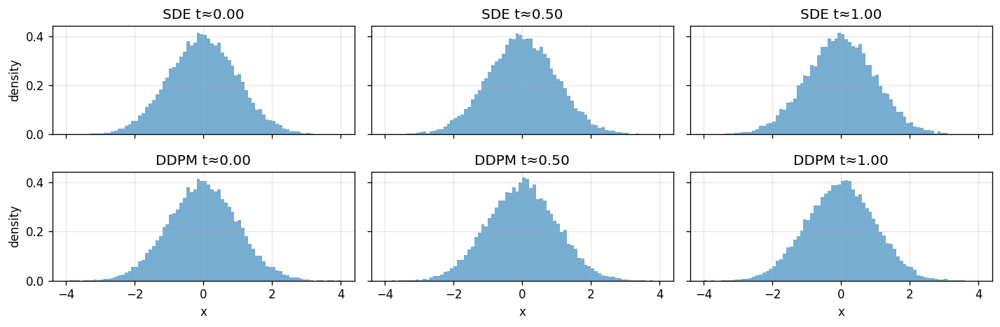

In [52]:
def summarize_distribution(samples: torch.Tensor, label: str):
    """
    Print mean and variance of a 1D sample tensor.
    """
    mean = samples.mean().item()
    var = samples.var(unbiased=False).item()
    print(f"{label}: mean = {mean:.3f}, var = {var:.3f}")

# Print basic stats at each time
print("=== Marginal statistics comparison (SDE vs DDPM) ===")
for i, (x_sde, x_ddpm) in enumerate(zip(xs_sde, xs_ddpm)):
    t = ts_sde[i]
    print(f"\nTime t ≈ {t:.3f}")
    summarize_distribution(x_sde, "  SDE  ")
    summarize_distribution(x_ddpm, "  DDPM ")

# Plot histograms side by side for a few times
times_to_plot = [0, 2, 4]  # indices in ts_sde / ts_ddpm lists (0, middle, final)
num_bins = 80
x_range = (-4, 4)

fig, axes = plt.subplots(2, len(times_to_plot), figsize=(12, 4), sharex=True, sharey=True)

for j, idx in enumerate(times_to_plot):
    t = ts_sde[idx]

    # SDE histogram (top row)
    ax_sde = axes[0, j]
    ax_sde.hist(
        xs_sde[idx].numpy(),
        bins=num_bins,
        range=x_range,
        density=True,
        alpha=0.6,
        label=f"SDE samples at t≈{t:.2f}",
    )
    ax_sde.set_title(f"SDE t≈{t:.2f}")
    ax_sde.grid(alpha=0.3)
    if j == 0:
        ax_sde.set_ylabel("density")

    # DDPM histogram (bottom row)
    ax_ddpm = axes[1, j]
    ax_ddpm.hist(
        xs_ddpm[idx].numpy(),
        bins=num_bins,
        range=x_range,
        density=True,
        alpha=0.6,
        label=f"DDPM samples at t≈{t:.2f}",
    )
    ax_ddpm.set_title(f"DDPM t≈{t:.2f}")
    ax_ddpm.grid(alpha=0.3)
    if j == 0:
        ax_ddpm.set_ylabel("density")
    ax_ddpm.set_xlabel("x")

plt.tight_layout()
plt.show()


### 6.3 Questions: comparing SDE and DDPM forward processes

Look at:

- the printed means and variances for SDE and DDPM at the times $t$,
- the histograms for both processes at the same $t$ values.

Try to answer:

1. How similar are the **means** and **variances** of $x_t$ under the SDE and under the DDPM process at the same time $t$?
2. For the histograms at intermediate times (for example the middle column), do the shapes for SDE and DDPM look similar?
   Are there visible differences?
3. In this experiment we used a **constant** scalar $\beta$ and defined
   $$
   \beta_t = \beta \, \Delta t, \quad \alpha_t = 1 - \beta_t
   $$
   for the DDPM steps. Why does choosing a **small** time step $\Delta t$ help the discrete process approximate
   the continuous SDE?
4. If you wanted the DDPM chain to approximate a more general VP SDE with time-dependent $\beta(t)$,
   how would you design the schedule $\{\beta_t\}$?
5. How does this comparison help you understand the connection between:
   - continuous-time score-based models (with SDEs), and
   - discrete-time DDPMs (with a finite number of noise steps)?


**Answers**

1. In this specific 1D VP setting with $x_0 \sim \mathcal{N}(0, 1)$, both the SDE and the DDPM chain
   are designed so that the marginal distribution $p_t(x)$ stays close to standard normal for all $t$.
   Numerically, you should see:
   - means close to $0$,
   - variances close to $1$,
   for both processes at each sampled time.

   Small deviations come from finite step size and Monte Carlo noise, not from a qualitative difference
   between the models.

2. The histograms for SDE and DDPM at the same time $t$ should look quite similar:
   both approximately Gaussian with similar spread. Minor differences in shape or tails can appear
   because:
   - the SDE is approximated by Euler-Maruyama,
   - the DDPM chain uses a simplified constant $\beta_t$ schedule,
   - we only have a finite number of samples.

   The important point is that they live in the **same family of noisy distributions**, and the gap
   shrinks as you refine the discretization (smaller $\Delta t$, more steps).

3. A continuous SDE describes infinitesimal changes. To approximate it with a discrete-time process,
   each step must be **small**:

   - When $\Delta t$ is small, the update
     $$
     x_{t + \Delta t} \approx x_t + f(x_t, t) \Delta t + g(t) \sqrt{\Delta t} \, \epsilon
     $$
     is well approximated by a Gaussian increment with small drift and variance.
   - The DDPM rule
     $x_{t+1} = \sqrt{\alpha_t} x_t + \sqrt{1 - \alpha_t} \epsilon_t$
     with $\beta_t = \beta \Delta t$ and $\alpha_t = 1 - \beta_t$
     can be seen as a **finite step approximation** to such an SDE.

   As $\Delta t \to 0$ and the number of steps grows, the discrete chain can converge in distribution
   to the continuous SDE.

4. For a time-dependent VP SDE with noise rate $\beta(t)$, a natural discrete approximation is:

   - Choose discrete times $t_0, t_1, \dots, t_T$,
   - Set $\beta_t \approx \beta(t) (t_{t} - t_{t-1})$ for each step,
   - Define
     $$
     \alpha_t = 1 - \beta_t, \quad
     \bar{\alpha}_t = \prod_{s=1}^t \alpha_s.
     $$

   In the limit of small steps, this schedule recovers the same cumulative noise effect as the SDE.
   This is essentially how continuous-time VP SDEs and discrete-time DDPM schedules are matched in theory.

5. This comparison shows that:

   - Both views describe a **family of noisy distributions** indexed by a noise level (time),
   - The SDE view uses continuous time with drift and diffusion,
   - The DDPM view uses a finite sequence of Gaussian transitions with a carefully chosen schedule.

   Once you see that their conditionals $x_t \mid x_0$ are of the same Gaussian form, it is clear why:
   - the **same DSM idea** (predicting noise or score at different noise levels) works in both settings,
   - many DDPM results can be interpreted as **time-discretized SDEs**, and
   - continuous-time and discrete-time diffusion models are just two parameterizations of the
     same underlying generative idea.

---

## 7. Summary and big picture

You have now seen two major families of likelihood based generative models:

1. **VAEs and hierarchical VAEs**
   - Introduce latent variables $z$ with a simple prior $p(z)$.
   - Use an encoder $q_\phi(z \mid x)$ to approximate the intractable posterior $p_\theta(z \mid x)$.
   - Use a decoder $p_\theta(x \mid z)$ to reconstruct or generate data.
   - Train by maximizing the ELBO:
     $$
     \log p_\theta(x)
     \ge
     \mathbb{E}_{q_\phi(z \mid x)}[\log p_\theta(x \mid z)]
       - \mathrm{KL}\big(q_\phi(z \mid x) \,\Vert\, p(z)\big).
     $$
   - Hierarchical VAEs stack multiple latent layers, which lets the model represent structure at different
     "levels" (coarse vs fine) in the data.

2. **Score based diffusion models (continuous and discrete)**
   - Define a forward **noising process** $x_0 \to x_t$ (SDE or DDPM chain) that gradually turns data into noise.
   - The distribution at time $t$ has density $p_t(x)$ and score $s_t(x) = \nabla_x \log p_t(x)$.
   - A reverse-time SDE (or reverse DDPM chain) uses the score to transform noise back into data.
   - In practice, we learn a neural network $s_\theta(x_t, t)$ (or a noise predictor $\epsilon_\theta(x_t, t)$)
     and train it with a denoising objective.

Key concepts you should take away:

- **Forward process**:
  - In VAEs: sample $z \sim p(z)$, then $x \sim p_\theta(x \mid z)$.
  - In diffusion: sample $x_0$ from data, then add noise to get $x_t$ along a schedule.

- **Reverse process**:
  - In VAEs: decode $z$ to reconstruct or generate $x$.
  - In diffusion: use the learned score (or noise predictor) step by step to denoise from $x_T$ back to $x_0$.

- **Training objectives**:
  - VAE: ELBO (reconstruction + KL) on $(x, z)$.
  - Diffusion: denoising score matching or noise-prediction loss on $(x_0, x_t, t)$.

- **Geometry of data**:
  - Latent VAEs try to learn a smooth latent space where $p(z)$ is simple.
  - Diffusion models never explicitly represent $z$, but directly learn the geometry of $p_t(x)$ via the score.

In the next discrete diffusion / D3PM notebook, you will see how similar ideas can be applied
when $x$ is **discrete** (e.g. sequences, tabular data, categorical variables) instead of continuous images.
There, the SDE is replaced by a **Markov chain on discrete states**, but the core logic is the same:

- simple forward process with known conditionals,
- learn to approximate the reverse process,
- use it to transform simple noise into samples that follow the data distribution.

---

> Acknowledgments:
>
> This notebook was inspired by the Neuromatch notebook on this topic, which is of very high quality, like all of their content.